In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

## **Part 1: Keypoint Extraction**

In this part, we extract the keypoints and descriptors from the first two images using the SIFT algorithm. We extract the keypoints and visualize them on the images to verify their correctness.

In [2]:
image1 = cv2.cvtColor(cv2.imread(r"Panorama/1.jpg"), cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(cv2.imread(r"Panorama/2.jpg"), cv2.COLOR_BGR2RGB)

gray1 = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

In [3]:
sift = cv2.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
keypoints2, descriptors2 = sift.detectAndCompute(gray2, None)

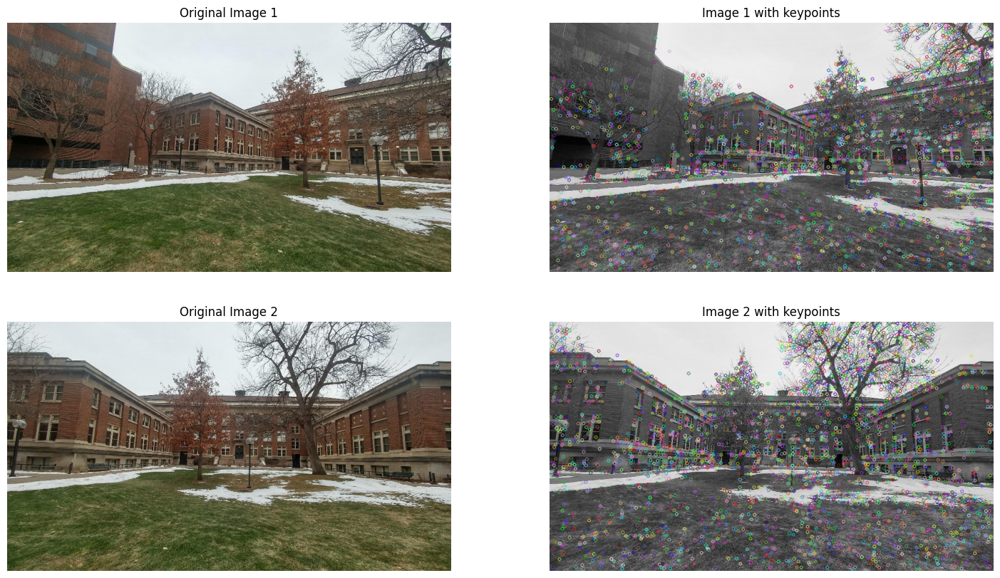

In [4]:
plt.figure(figsize=(18, 10))

plt.subplot(2, 2, 1)
plt.imshow(image1)
plt.title("Original Image 1")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(cv2.drawKeypoints(gray1, keypoints1, None), cmap="gray")
plt.title("Image 1 with keypoints")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(image2)
plt.title("Original Image 2")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(cv2.drawKeypoints(gray2, keypoints2, None), cmap="gray")
plt.title("Image 2 with keypoints")
plt.axis("off")

plt.show()

## **Part 2: Feature Matching**

In this part, we match the features of the two images using the keypoints and descriptors found above, using Brute Force Matching and FLANN-based matching. After performing the matching, we display the matched features by drawing lines between the matched keypoints. The matches are displayed on grayed images for better visibility.

In [5]:
bf_matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
bf_matches = bf_matcher.match(descriptors1, descriptors2)
bf_matches = [match for match in bf_matches if match.distance < 0.75 * bf_matches[1].distance]
bf_matched = cv2.drawMatches(gray1, keypoints1, gray2, keypoints2, bf_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

In [6]:
flann_matcher = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=50))
flann_matches = flann_matcher.knnMatch(descriptors1, descriptors2, k=2)
flann_matches = [m for m, n in flann_matches if m.distance < 0.7 * n.distance]
flann_matched = cv2.drawMatches(gray1, keypoints1, gray2, keypoints2, flann_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

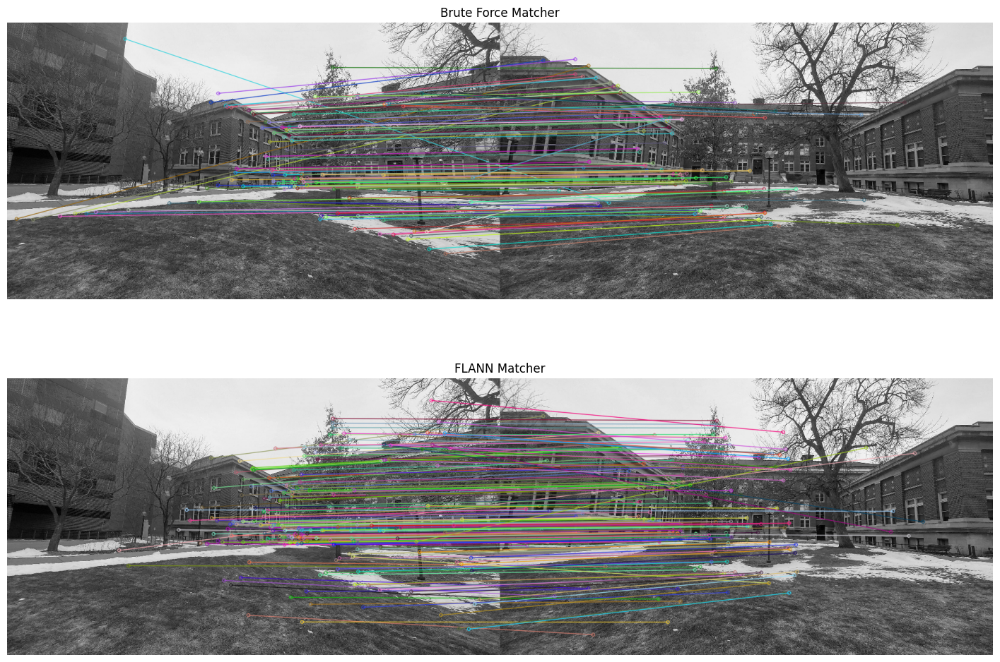

In [7]:
plt.figure(figsize=(18, 12))

plt.subplot(2, 1, 1)
plt.imshow(bf_matched)
plt.title("Brute Force Matcher")
plt.axis("off")

plt.subplot(2, 1, 2)
plt.imshow(flann_matched)
plt.title("FLANN Matcher")
plt.axis("off")

plt.show()

In [8]:
print("Number of matches using Brute Force Matcher:", len(bf_matches))
print("Number of matches using FLANN Matcher:", len(flann_matches))

Number of matches using Brute Force Matcher: 117
Number of matches using FLANN Matcher: 202


## **Part 3: Homography Estimation**

We now compute the homography matrix using the matched keypoints using the RANSAC algorithm so that we can generate panoramas.

In [9]:
SRC = np.array([keypoints1[m.queryIdx].pt for m in flann_matches]).reshape(-1, 1, 2)
DST = np.array([keypoints2[m.trainIdx].pt for m in flann_matches]).reshape(-1, 1, 2)

In [10]:
homography, _ = cv2.findHomography(SRC, DST, cv2.RANSAC, 1.0)
homography

array([[-5.23679049e+01,  1.12475666e+00,  1.89550690e+04],
       [-1.59166398e+01, -3.22091480e+01,  9.88081031e+03],
       [-5.44424873e-02, -1.22493344e-03,  1.00000000e+00]])

## **Part 4: Perspective Warping**

We now warp the two images together using the obtained Homography matrix and display the left and right sides of the resulting panorama before cropping and blending. We perform two different warpings on the left image - one to generate the panorama, and one to orient the image to look the same as the right image.

### **Warping to generate panorama**

We warp the left image by the product of the translation and homography matrix. The shape of the obtained image is the sum of the shapes of the two images.

In [11]:
translation = np.array([
    [1, 0, image1.shape[1]],
    [0, 1, image1.shape[0]],
    [0, 0, 1]
])

M = translation @ homography
left_shape = (image1.shape[1]+image2.shape[1], image1.shape[0]+image2.shape[0])

left = cv2.warpPerspective(image1, M, left_shape)
right = image2.copy()

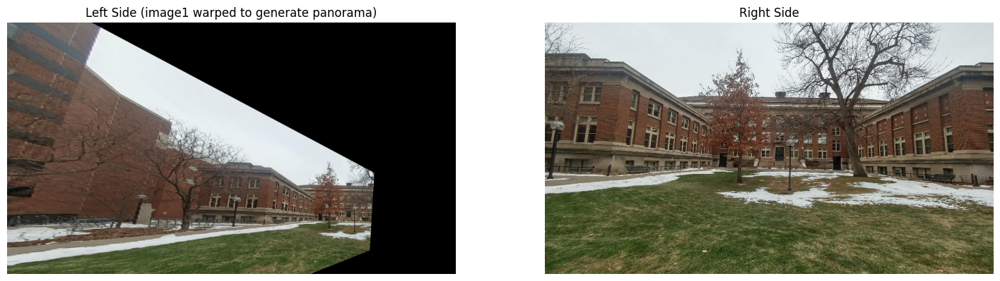

In [12]:
plt.figure(figsize=(18, 12))

plt.subplot(1, 2, 1)
plt.imshow(left)
plt.title("Left Side (image1 warped to generate panorama)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(right)
plt.title("Right Side")
plt.axis("off")

plt.show()

### **Warping to orient and blend the left image**

To orient the left image to look the same as the right image, we warp the left image by the homography matrix. The shape of the obtained image is the same as the original shape.

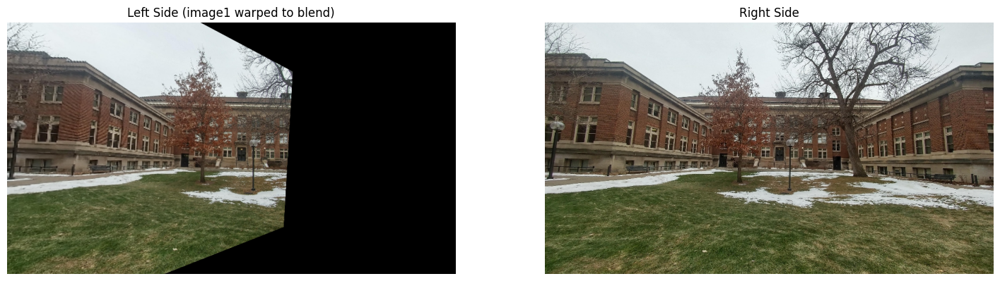

In [13]:
left_side = cv2.warpPerspective(image1, homography, image1.shape[1::-1])
right_side = image2.copy()

plt.figure(figsize=(18, 12))

plt.subplot(1, 2, 1)
plt.imshow(left_side)
plt.title("Left Side (image1 warped to blend)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(right_side)
plt.title("Right Side")
plt.axis("off")

plt.show()

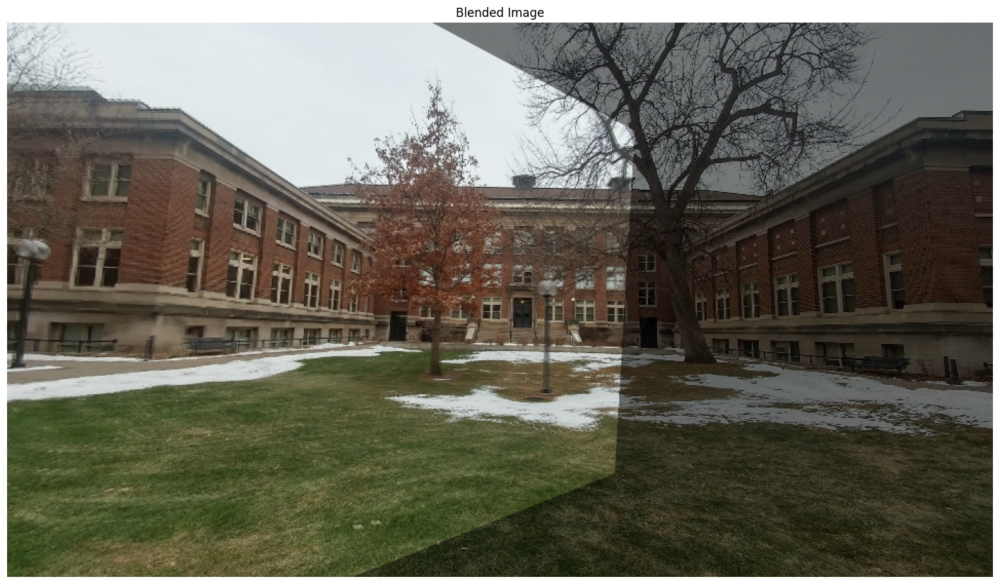

In [14]:
blended = cv2.addWeighted(left_side, 0.5, right_side, 0.5, 0.0)

plt.figure(figsize=(18, 12))
plt.imshow(blended)
plt.title("Blended Image")
plt.axis("off")
plt.show()

In [15]:
print("Left Side of Panorama (image1 warped):", left.shape)
print("Right Side of Panorama (image2 warped):", right_side.shape)

Left Side of Panorama (image1 warped): (1080, 1920, 3)
Right Side of Panorama (image2 warped): (540, 960, 3)


## **Part 5: Stitching**

Finally, we stitch the two images together to create a panorama and display the final result. We stitch the right image with the left image obtained by warping to generate the panorama - as it covers new areas not present in the second image.

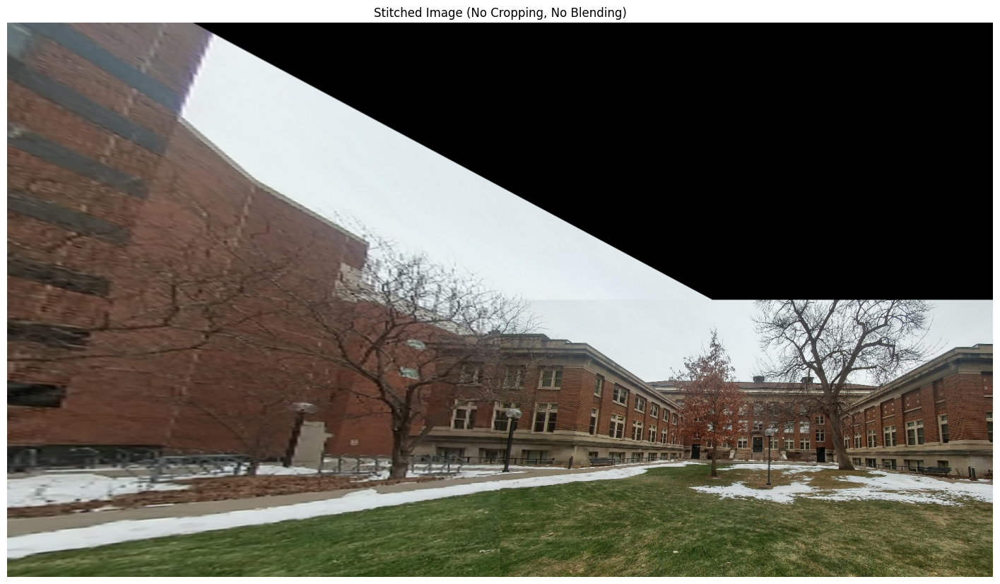

In [16]:
stitched = left.copy()
stitched[image1.shape[0]:, image1.shape[1]:] = image2.copy()

plt.figure(figsize=(18, 12))
plt.imshow(stitched)
plt.title("Stitched Image (No Cropping, No Blending)")
plt.axis("off")
plt.show()

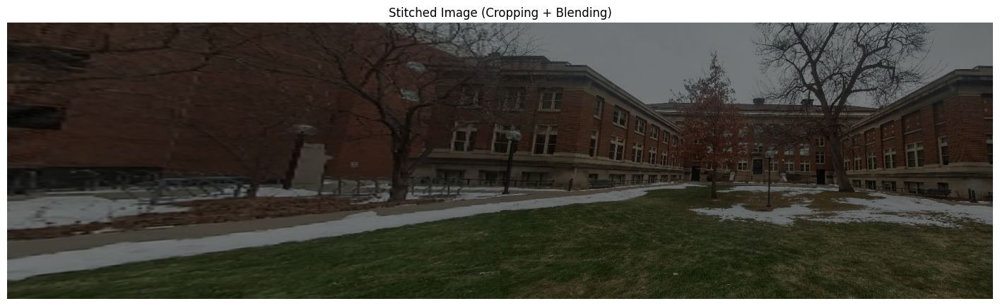

In [17]:
shape = (max(image1.shape[0], image2.shape[0]), image1.shape[1]+image2.shape[1], 3)
stitched1 = np.zeros(shape, dtype=np.uint8)
stitched2 = np.zeros(shape, dtype=np.uint8)

stitched1[:image1.shape[0], :image1.shape[1]] = left[image1.shape[0]:, :image1.shape[1]]
stitched2[:image2.shape[0], image1.shape[1]:] = image2.copy()

stitched = cv2.addWeighted(stitched1, 0.5, stitched2, 0.5, 0.0)

plt.figure(figsize=(18, 12))
plt.imshow(stitched)
plt.title("Stitched Image (Cropping + Blending)")
plt.axis("off")
plt.show()

## **Part 5: Multi-Stitching Panorama Generation**

Finally, in this part, we load all the images in the given dataset and stitch all of them together using the stitcher provided by cv2. We generate and display the resultant panorama.

In [20]:
images = [cv2.imread(os.path.join("Panorama", image)) for image in os.listdir("Panorama")]
stitcher = cv2.Stitcher_create()
_, panorama = stitcher.stitch(images)

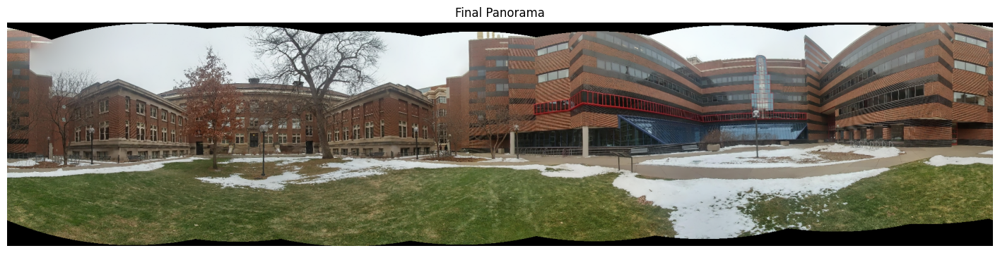

In [21]:
plt.figure(figsize=(18, 12))
plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
plt.title("Final Panorama")
plt.axis("off")
plt.show()